# Jul 8th, 2022 (Fig-5 proportion plot)

**Motivation**:  <br>

In [1]:
# HIDE CODE


import os
import sys
from pprint import pprint
from copy import deepcopy as dc
from os.path import join as pjoin
from scipy.ndimage import gaussian_filter
from IPython.display import display, IFrame, HTML

# tmp & extras dir
git_dir = pjoin(os.environ['HOME'], 'Dropbox/git')
extras_dir = pjoin(git_dir, 'jb-Ca-fMRI/_extras')
fig_base_dir = pjoin(git_dir, 'jb-Ca-fMRI/figs')
tmp_dir = pjoin(git_dir, 'jb-Ca-fMRI/tmp')

# GitHub
sys.path.insert(0, pjoin(git_dir, '_Ca-fMRI'))
from model.mouse import Mice
from model.configuration import Config
from analysis.final import *
from utils.render import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from tqdm.notebook import tqdm
%matplotlib inline
set_style()

## Fig dir

In [2]:
nn = 512
fig_dir = 'Fig5_Proportions'
fig_dir = pjoin(fig_base_dir, 'paper2.0', f'n{nn}', fig_dir)
os.makedirs(fig_dir, exist_ok=True)
print(fig_dir)

kws_fig = {
    'transparent': True,
    'bbox_inches': 'tight',
    'dpi': 300,
}

/home/hadi/Dropbox/git/jb-Ca-fMRI/figs/paper2.0/n512/Fig5_Proportions

## Prepare (512)

In [3]:
mice = Mice(nn)

## Results (K = 7)

In [4]:
%%time

num_k = 7
results = proportion_results(
    mice=mice,
    num_k=num_k,
    merge_thres=0.372,
    n_resamples=int(1e5),
    global_order=('infer', False),
    bin_edges=(0.2, 1),
    n_cuts=4,
)
bt = BootStrap(**results['props_ca'])
list(results)

CPU times: user 25min 31s, sys: 5min 4s, total: 30min 36s
Wall time: 30min 36s


['bt_dict', 'props_bo', 'props_ca', 'pi_sorted', 'df', 'bins']

### OCs

In [5]:
kws_show = {
    'vmin': 0.2,
    'vmax': 0.9,
    'mask_thresh': 1 / num_k,
    'add_disjoint': True,
    'add_title': True,
}

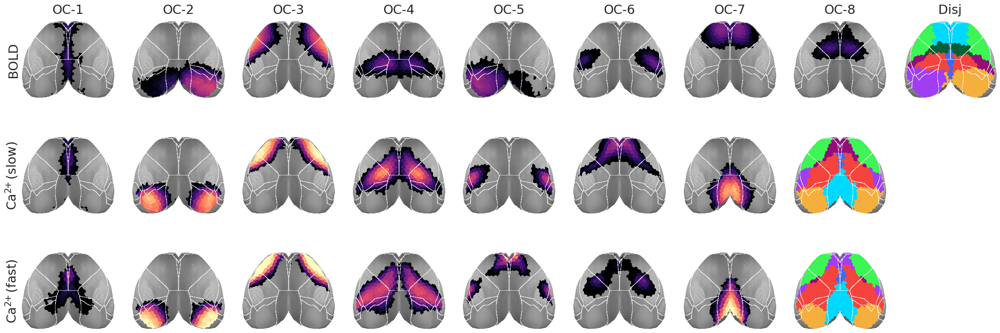

In [6]:
_ = bt.show(
    data={mode: avg(o.run_pi) for mode, o in results['bt_dict'].items()},
    **kws_show,
)

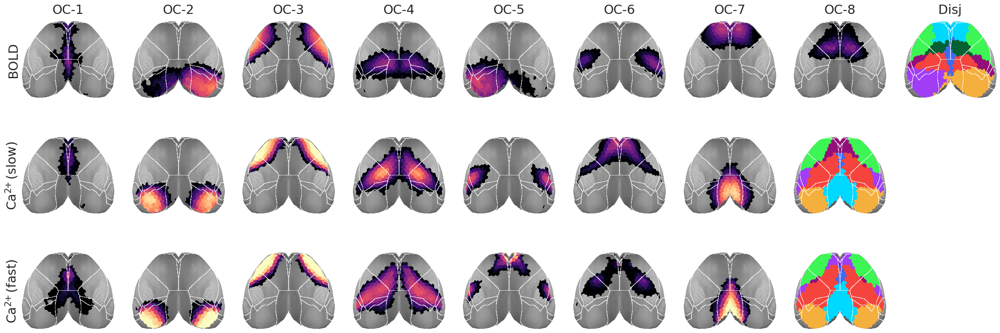

In [7]:
_ = bt.show(
    data={mode: avg(o.pi_prune) for mode, o in results['bt_dict'].items()},
    **kws_show,
)

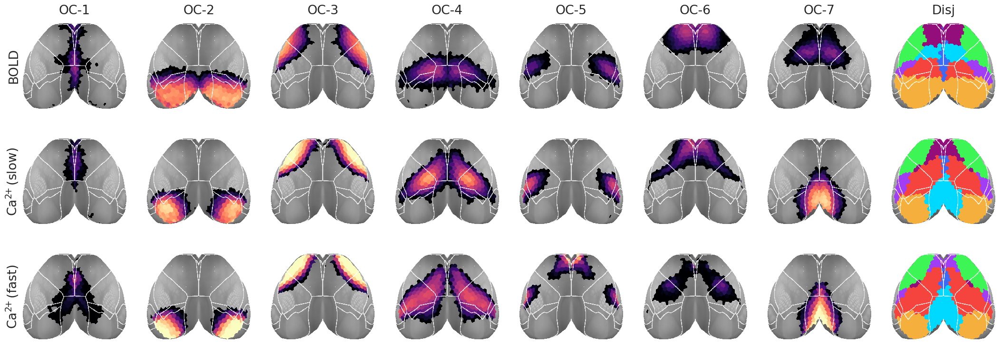

In [8]:
data = {}
for mode, o in results['bt_dict'].items():
    if mode == BOLD:
        data[mode] = avg(o.merge_vis(
            0.372, o.pi_prune)[0])
    else:
        data[mode] = avg(o.pi_prune)
_ = bt.show(data, **kws_show)

### Propotion plot

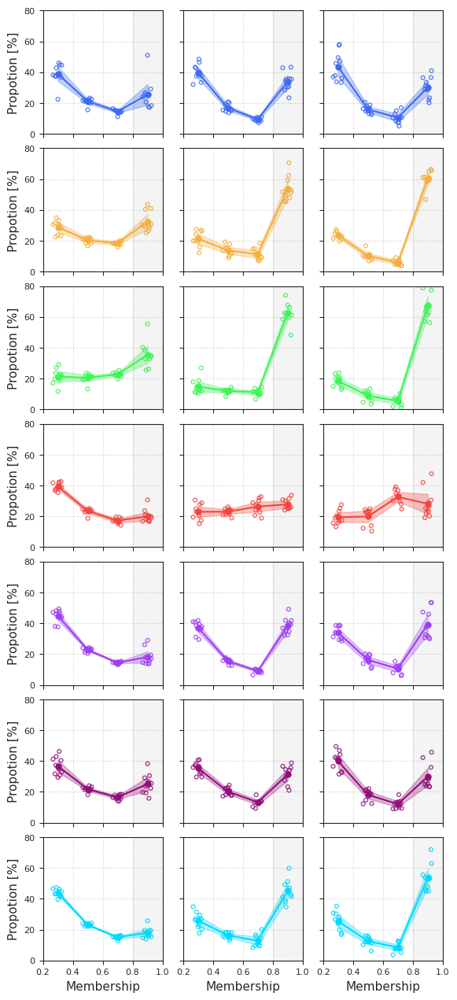

In [9]:
from figures.fig_prop import proportions_line as go
fig, _ = go(results['df'], results['bins'])

fig.savefig(pjoin(fig_dir, f'prop_ln_K{num_k}.pdf'), **kws_fig)
fig.savefig(pjoin(fig_dir, f'props_ln_K{num_k}.png'), **kws_fig)

## Results (K = 3)

In [10]:
%%time

num_k = 3
results = proportion_results(
    mice=mice,
    num_k=num_k,
    n_resamples=int(1e5),
    bin_edges=(0.2, 1),
    n_cuts=4,
)
bt = BootStrap(**results['props_ca'])
list(results)

CPU times: user 7min 34s, sys: 903 ms, total: 7min 35s
Wall time: 7min 35s


['bt_dict', 'props_bo', 'props_ca', 'pi_sorted', 'df', 'bins']

### OCs

In [11]:
kws_show = {
    'vmin': 0.2,
    'vmax': 0.9,
    'mask_thresh': 0.15,
    'add_disjoint': True,
    'add_title': True,
    'figsize_x': 3,
}

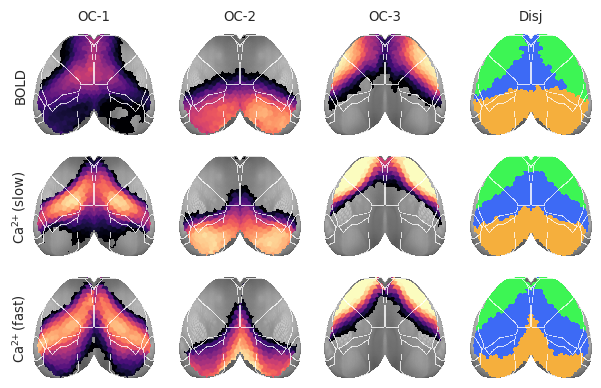

In [12]:
_ = bt.show(
    data={mode: avg(o.run_pi) for mode, o in results['bt_dict'].items()},
    **kws_show,
)

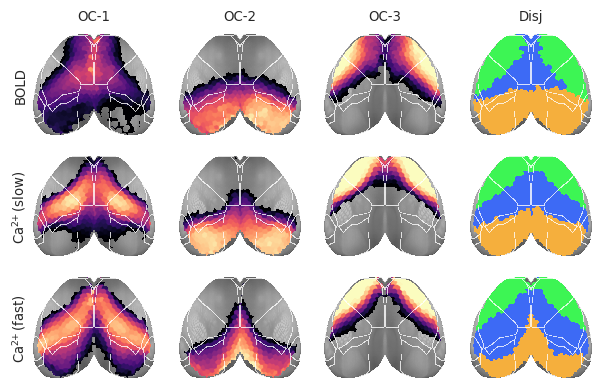

In [13]:
_ = bt.show(
    data={mode: avg(o.pi_prune) for mode, o in results['bt_dict'].items()},
    **kws_show,
)

### Propotion plot

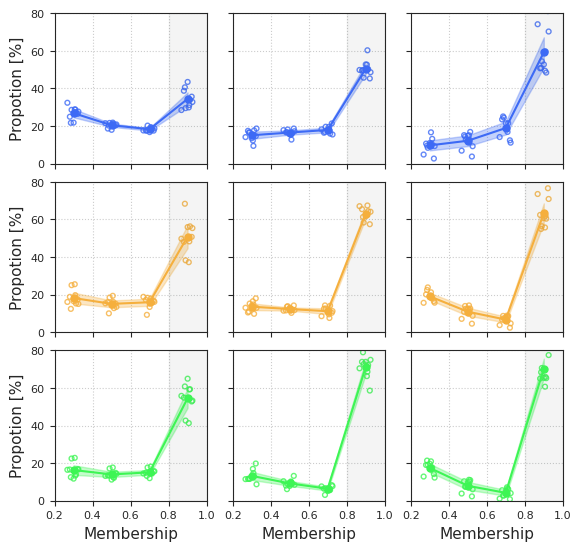

In [14]:
from figures.fig_prop import proportions_line as go
fig, _ = go(results['df'], results['bins'])

fig.savefig(pjoin(fig_dir, f'prop_ln_K{num_k}.pdf'), **kws_fig)
fig.savefig(pjoin(fig_dir, f'props_ln_K{num_k}.png'), **kws_fig)

## Results (K = 20)

In [15]:
%%time

num_k = 20
results = proportion_results(
    mice=mice,
    num_k=num_k,
    n_resamples=int(1e5),
    bin_edges=(0.2, 1),
    n_cuts=4,
)
bt = BootStrap(**results['props_ca'])
list(results)

CPU times: user 1h 18min 49s, sys: 14min 59s, total: 1h 33min 48s
Wall time: 1h 33min 48s


['bt_dict', 'props_bo', 'props_ca', 'pi_sorted', 'df', 'bins']

### OCs

In [16]:
kws_show = {
    'vmin': 0.0,
    'vmax': 0.7,
    'mask_thresh': 1/ 20,
    'contour_alpha': 0.6,
    'contour_width': 0.2,
    'contour_coarse': False,
    'add_disjoint': True,
    'add_title': True,
    'figsize_x': 13.5,
}

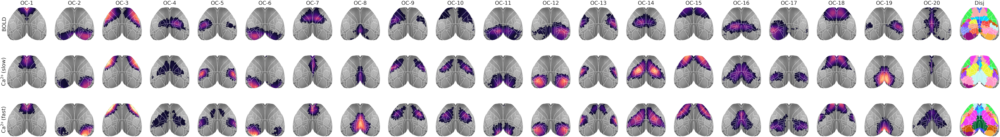

In [17]:
_ = bt.show(
    data={mode: avg(o.run_pi) for mode, o in results['bt_dict'].items()},
    **kws_show,
)

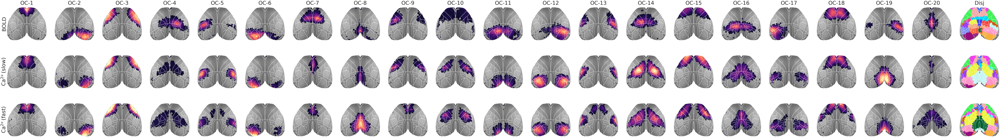

In [18]:
_ = bt.show(
    data={mode: avg(o.pi_prune) for mode, o in results['bt_dict'].items()},
    **kws_show,
)

### Propotion plot

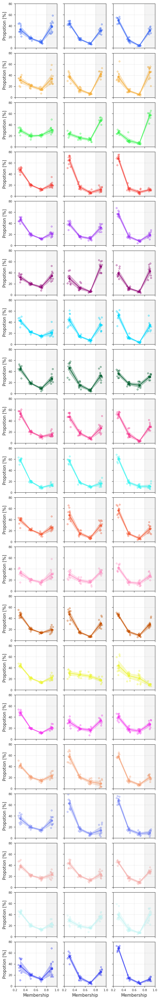

In [19]:
from figures.fig_prop import proportions_line as go
fig, _ = go(results['df'], results['bins'])

fig.savefig(pjoin(fig_dir, f'prop_ln_K{num_k}.pdf'), **kws_fig)
fig.savefig(pjoin(fig_dir, f'props_ln_K{num_k}.png'), **kws_fig)

## Select good color

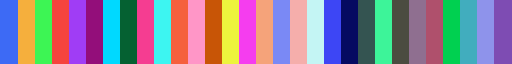

In [8]:
cmap = get_cluster_cmap(range(30))
cmap

In [18]:
partition = {mode: o.get_disjoint_community() for mode, o in bt_dict.items()}

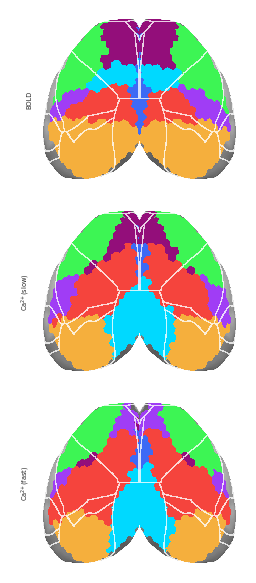

In [19]:
cmap = get_cluster_cmap(range(7))
_ = bt.show(
    data=partition,
    vmin=1,
    vmax=7,
    cmap=cmap,
    interp='none',
    figsize_x=4,
    figsize_y=6,
    dpi=200,
)

In [22]:
from figures.fighelper import prepare_palette
pal = prepare_palette()

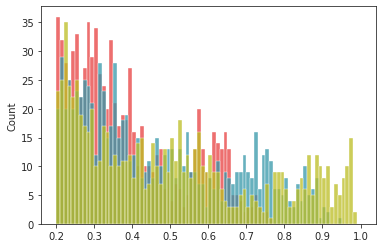

In [28]:
for mode, x in pi_sorted.items():
    sns.histplot(x[np.isfinite(x)], bins=np.linspace(0.2, 1, 81), color=pal[mode])

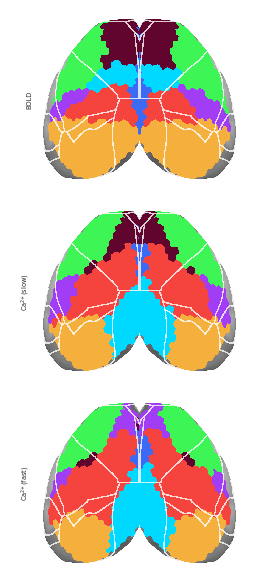